In [1]:
pip install easyocr opencv-python pandas


Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os
import re
import cv2
import pandas as pd
import easyocr

reader = easyocr.Reader(['en'], gpu=False)


# ---------------------------------------------------------
# Crop PS/ED region (yellow block)
# ---------------------------------------------------------
def crop_ps_ed_region(img):
    h, w, _ = img.shape
    x1 = int(w * 0.45)
    x2 = int(w * 0.85)
    y1 = int(h * 0.20)
    y2 = int(h * 0.70)
    return img[y1:y2, x1:x2]


# ---------------------------------------------------------
# Extract PS and ED
# ---------------------------------------------------------
def extract_ps(text):
    m = re.search(r"PS\s*[-=:]?\s*([\d\.]+)", text, re.IGNORECASE)
    return float(m.group(1)) if m else None

def extract_ed(text):
    m = re.search(r"ED\s*[-=:]?\s*([\d\.]+)", text, re.IGNORECASE)
    return float(m.group(1)) if m else None


# ---------------------------------------------------------
# Extract side (Lt / Rt / Left / Right)
# ---------------------------------------------------------
def detect_side(full_text):
    t = full_text.lower()

    # Strong detection rules
    if "lt " in t or t.startswith("lt") or "left" in t:
        return "Left"
    if "rt " in t or t.startswith("rt") or "right" in t:
        return "Right"

    # fallback: single letters BUT ONLY if isolated
    if re.search(r"\bl\b", t):
        return "Left"
    if re.search(r"\br\b", t):
        return "Right"

    return None


# ---------------------------------------------------------
# Main extraction
# ---------------------------------------------------------
def extract_from_main(main_folder):
    results = []

    for root, _, files in os.walk(main_folder):
        folder_name = os.path.basename(root)

        for file in files:

            if not file.lower().endswith((".png", ".jpg", ".jpeg", ".bmp", ".tif")):
                continue

            img_path = os.path.join(root, file)
            img = cv2.imread(img_path)

            if img is None:
                print(f"❌ Cannot read: {img_path}")
                continue

            # ---- Step 1: OCR on cropped region for PS/ED ----
            crop = crop_ps_ed_region(img)
            crop_text_list = reader.readtext(crop, detail=0)
            crop_text = " ".join(crop_text_list)

            # ---- Step 2: OCR on full image for SIDE ----
            full_text_list = reader.readtext(img, detail=0)
            full_text = " ".join(full_text_list)

            # Extract PS/ED
            ps = extract_ps(crop_text)
            ed = extract_ed(crop_text)

            # Extract side from the FULL image text
            side = detect_side(full_text)

            print(f"Processed → Folder: {folder_name} | File: {file} | PS={ps} | ED={ed} | Side={side}")

            results.append({
                "folder": folder_name,
                "image": file,
                "PS": ps,
                "ED": ed,
                "Side": side
            })

    df = pd.DataFrame(results)
    out_csv = os.path.join(main_folder, "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Filesfinal_results.csv")
    df.to_csv(out_csv, index=False)

    print("\nSaved CSV:", out_csv)
    return df


# -------- RUN ----------
main_folder = r"/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"
extract_from_main(main_folder)


Using CPU. Note: This module is much faster with a GPU.
/opt/conda/lib/python3.12/site-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Processed → Folder: 29 | File: DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000034.png | PS=38.08 | ED=11.51 | Side=Left
Processed → Folder: 29 | File: DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000008.png | PS=50.94 | ED=9.89 | Side=Left
Processed → Folder: 29 | File: DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000007.png | PS=None | ED=None | Side=Left
Processed → Folder: 29 | File: DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000055.png | PS=49.39 | ED=8.33 | Side=Right
Processed → Folder: 29 | File: DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000036.png | PS=151.06 | ED=48.24 | Side=Left
Processed → Folder: 29 | File: DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000059.png | PS=57.12 | ED=20.83 | Side=Right
Processed → Folder: 29 | File: DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000061.png | PS=111.27 | ED=38.08 | Side=Right
Processed → Folder: 29 | File: DICOM\1.3.12.2.1107.5.5.17.820288.300

In [3]:
import pandas as pd
import os

# Load your extracted CSV
df_extract = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Filesfinal_results.csv")

# Load your clinical CSV
df_clin = pd.read_csv("/work/SanzidaAkterChadne#0992/Linked_stenosis_image_dataset.csv")

# Extract filename from image_path so it matches the "image" column
df_clin["image"] = df_clin["image_path"].apply(lambda x: os.path.basename(str(x)))

# Select only the columns you want to add
cols_to_add = ["image", "prox_ica_right_stenosis", "prox_ica_left_stenosis"]

df_clin_small = df_clin[cols_to_add]

# Merge on image name
merged = df_extract.merge(df_clin_small, on="image", how="left")

# Save output
merged.to_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/lf_rt_added.csv", index=False)

print("Merged CSV saved as lf_rt_added.csv")


Merged CSV saved as lf_rt_added.csv


In [5]:
import pandas as pd

df = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/lf_rt_added.csv")

# Remove rows where folder == '.ipynb_checkpoints'
df_clean = df[df["folder"] != ".ipynb_checkpoints"]

# Save cleaned CSV
df_clean.to_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/ipynb_checkpoints_deleted.csv", index=False)

print("Cleaned CSV saved as ipynb_checkpoints_deleted.csv")


Cleaned CSV saved as ipynb_checkpoints_deleted.csv


In [7]:
import pandas as pd

df = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/ipynb_checkpoints_deleted.csv")

# Create new column based on Side
df["detected_side_value"] = df.apply(
    lambda row: row["prox_ica_right_stenosis"] 
                if row["Side"] == "Right" 
                else (row["prox_ica_left_stenosis"] 
                      if row["Side"] == "Left" 
                      else None),
    axis=1
)

df.to_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Detected_side_value.csv", index=False)

print("✔ New file saved: Detected_side_value.csv")


✔ New file saved: Detected_side_value.csv



Randomly selected image:
 /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/16/.ipynb_checkpoints/DICOM\1.3.12.2.1107.5.5.17.820288.30000024091107502152100000018-checkpoint.png

Jet Features:
 jet_area: 302
 jet_width: 16
 jet_height: 22
 jet_length: 27.202941017470888

Color Ratios (Percentages):
 red_ratio: 15.340909 %
 orange_yellow_ratio: 37.500000 %
 blue_ratio: 34.375000 %


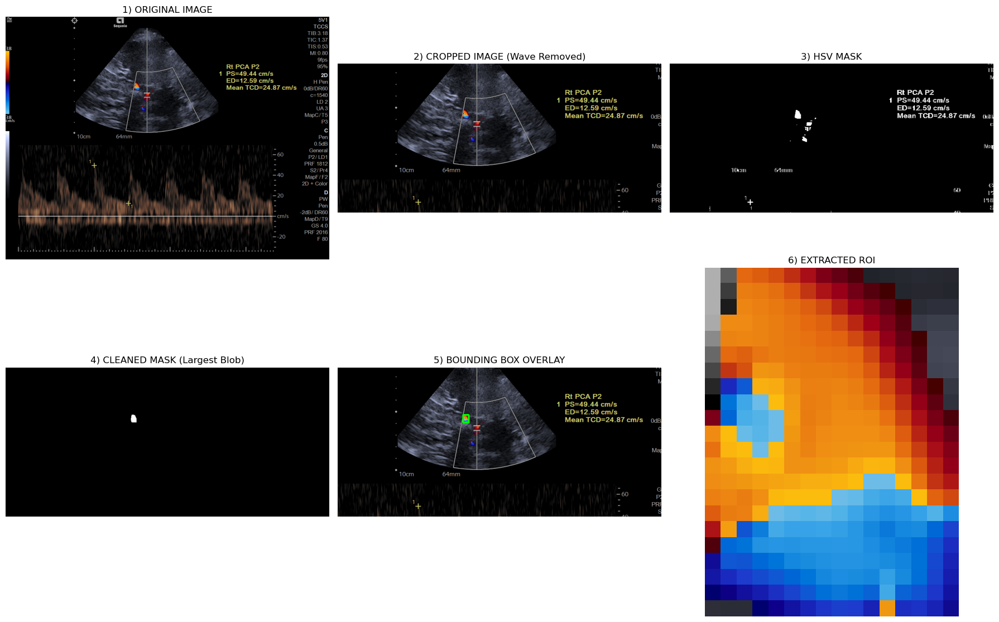

In [9]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
from math import exp


# -----------------------------------------------------------
# USER — Set PNG directory
# -----------------------------------------------------------
png_root = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"


# -----------------------------------------------------------
# STEP 0 — Load random image
# -----------------------------------------------------------
all_pngs = []
for root, dirs, files in os.walk(png_root):
    for f in files:
        if f.lower().endswith(".png"):
            all_pngs.append(os.path.join(root, f))

img_path = random.choice(all_pngs)
print("\nRandomly selected image:\n", img_path)

img = cv2.imread(img_path)
img_rgb_original = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


# -----------------------------------------------------------
# STEP A — AUTO-CROP ULTRASOUND + REMOVE WAVEFORM
# -----------------------------------------------------------
def auto_crop_ultrasound(im):
    h, w = im.shape[:2]

    crop_top = int(h * 0.10)      # remove top text
    crop_bottom = int(h * 0.35)   # remove waveform (large bottom crop)
    crop_left = int(w * 0.05)
    crop_right = int(w * 0.05)

    cropped = im[crop_top:h - crop_bottom, crop_left:w - crop_right]
    return cropped


cropped = auto_crop_ultrasound(img)
img_rgb = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
hsv = cv2.cvtColor(cropped, cv2.COLOR_BGR2HSV)


# -----------------------------------------------------------
# STEP 1 — HSV Doppler Mask
# -----------------------------------------------------------
lower_red1 = np.array([0, 80, 80])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 80, 80])
upper_red2 = np.array([180, 255, 255])
mask_red = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)

lower_oy = np.array([10, 120, 80])
upper_oy = np.array([35, 255, 255])
mask_oy = cv2.inRange(hsv, lower_oy, upper_oy)

lower_blue = np.array([85, 60, 60])
upper_blue = np.array([140, 255, 255])
mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)

mask = mask_red | mask_oy | mask_blue


# -----------------------------------------------------------
# STEP 2 — Morphology + Largest Component
# -----------------------------------------------------------
kernel = np.ones((7, 7), np.uint8)
clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
clean = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel)

labels = label(clean)
regions = regionprops(labels)

if len(regions) == 0:
    raise ValueError("No Doppler region found!")


# -----------------------------------------------------------
# SMART SELECTION OF DOPPLER FLOW REGION
# -----------------------------------------------------------
H, W = mask.shape[:2]
scores = []

for i, r in enumerate(regions):

    area = r.area
    minr, minc, maxr, maxc = r.bbox
    width = maxc - minc
    height = maxr - minr

    # Reject very thin or super-wide regions (noise)
    if height < 12 or width < 15:
        continue

    centroid_r = r.centroid[0]

    convex_area = r.convex_area if r.convex_area > 0 else area
    solidity = area / convex_area

    sub_mask = (labels == (i+1)).astype("uint8")
    mean_sat = np.mean(hsv[minr:maxr, minc:maxc, 1][sub_mask[minr:maxr, minc:maxc] > 0])

    # Scoring function
    score = (area / (H*W)) * solidity * (mean_sat/255) * (1 - centroid_r/H)
    scores.append((score, i+1, r.bbox))

# pick best region
scores.sort(reverse=True)
_, best_idx, (minr, minc, maxr, maxc) = scores[0]

final_mask = (labels == best_idx).astype("uint8") * 255


# -----------------------------------------------------------
# STEP 3 — Bounding Box Overlay
# -----------------------------------------------------------
overlay = img_rgb.copy()
cv2.rectangle(overlay, (minc, minr), (maxc, maxr), (0, 255, 0), 3)


# -----------------------------------------------------------
# STEP 4 — Extract ROI
# -----------------------------------------------------------
roi = img_rgb[minr:maxr, minc:maxc]


# -----------------------------------------------------------
# STEP 5 — Feature Extraction
# -----------------------------------------------------------
jet_area = final_mask[minr:maxr, minc:maxc].sum() // 255
jet_width = maxc - minc
jet_height = maxr - minr
jet_length = np.sqrt(jet_width**2 + jet_height**2)


# -----------------------------------------------------------
# STEP 6 — COLOR RATIOS
# -----------------------------------------------------------
roi_size = roi.shape[0] * roi.shape[1] + 1e-6

red_ratio = mask_red[minr:maxr, minc:maxc].sum() / 255 / roi_size
oy_ratio  = mask_oy[minr:maxr, minc:maxc].sum() / 255 / roi_size
blue_ratio = mask_blue[minr:maxr, minc:maxc].sum() / 255 / roi_size


# -----------------------------------------------------------
# PRINT VALUES
# -----------------------------------------------------------
print("\nJet Features:")
print(" jet_area:", jet_area)
print(" jet_width:", jet_width)
print(" jet_height:", jet_height)
print(" jet_length:", jet_length)

print("\nColor Ratios (Percentages):")
print(f" red_ratio: {red_ratio * 100:.6f} %")
print(f" orange_yellow_ratio: {oy_ratio * 100:.6f} %")
print(f" blue_ratio: {blue_ratio * 100:.6f} %")


# -----------------------------------------------------------
# STEP 7 — VISUALIZATION (6 panels)
# -----------------------------------------------------------
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.title("1) ORIGINAL IMAGE")
plt.imshow(img_rgb_original)
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("2) CROPPED IMAGE (Wave Removed)")
plt.imshow(img_rgb)
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("3) HSV MASK")
plt.imshow(mask, cmap="gray")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("4) CLEANED MASK (Largest Blob)")
plt.imshow(final_mask, cmap="gray")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("5) BOUNDING BOX OVERLAY")
plt.imshow(overlay)
plt.axis("off")

plt.subplot(2, 3, 6)
plt.title("6) EXTRACTED ROI")
plt.imshow(roi)
plt.axis("off")

plt.tight_layout()
plt.show()



Randomly selected image:
 /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/15/DICOM\1.3.12.2.1107.5.5.17.820288.30000024091006173009800000060.png

Jet Features:
 jet_area: 7063
 jet_width: 167
 jet_height: 81
 jet_length: 185.60711193270586

Color Ratios (Percentages):
 red_ratio: 35.477194 %
 orange_yellow_ratio: 0.110889 %
 blue_ratio: 17.816219 %


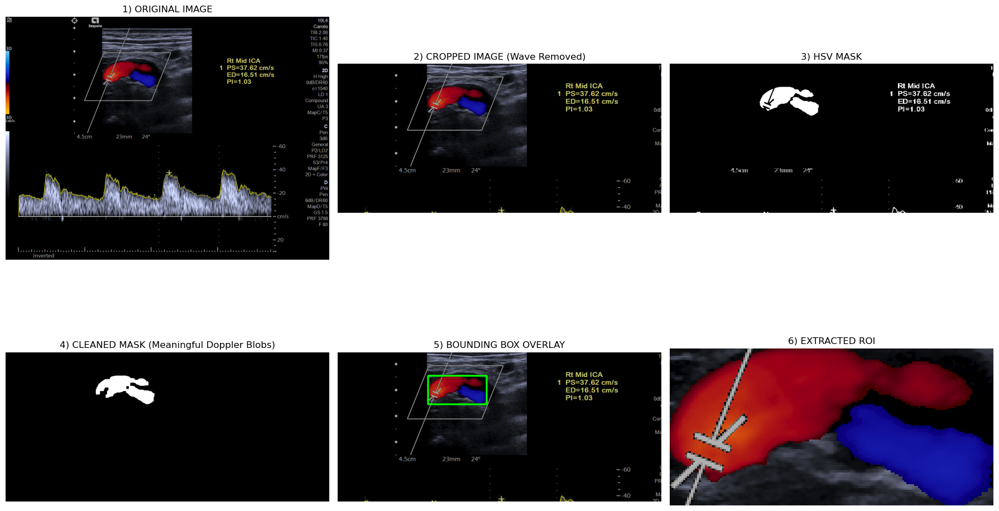

In [13]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label, regionprops
from math import exp


# -----------------------------------------------------------
# USER — Set PNG directory
# -----------------------------------------------------------
png_root = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"


# -----------------------------------------------------------
# STEP 0 — Load random image
# -----------------------------------------------------------
all_pngs = []
for root, dirs, files in os.walk(png_root):
    for f in files:
        if f.lower().endswith(".png"):
            all_pngs.append(os.path.join(root, f))

img_path = random.choice(all_pngs)
print("\nRandomly selected image:\n", img_path)

img = cv2.imread(img_path)
img_rgb_original = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


# -----------------------------------------------------------
# STEP A — AUTO-CROP ULTRASOUND + REMOVE WAVEFORM
# -----------------------------------------------------------
def auto_crop_ultrasound(im):
    h, w = im.shape[:2]

    crop_top = int(h * 0.10)      # remove top text
    crop_bottom = int(h * 0.35)   # remove waveform
    crop_left = int(w * 0.05)
    crop_right = int(w * 0.05)

    cropped = im[crop_top:h - crop_bottom, crop_left:w - crop_right]
    return cropped


cropped = auto_crop_ultrasound(img)
img_rgb = cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)
hsv = cv2.cvtColor(cropped, cv2.COLOR_BGR2HSV)


# -----------------------------------------------------------
# STEP B — Remove very small blobs (noise, text, spikes)
# -----------------------------------------------------------
def remove_small_blobs(binary_mask, min_area=40):
    labels = label(binary_mask)
    cleaned = np.zeros_like(binary_mask)

    for r in regionprops(labels):
        if r.area >= min_area:       # keep only meaningful blobs
            cleaned[labels == r.label] = 255

    return cleaned


# -----------------------------------------------------------
# STEP 1 — HSV Doppler Mask
# -----------------------------------------------------------
lower_red1 = np.array([0, 80, 80])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 80, 80])
upper_red2 = np.array([180, 255, 255])
mask_red = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)

lower_oy = np.array([10, 120, 80])
upper_oy = np.array([35, 255, 255])
mask_oy = cv2.inRange(hsv, lower_oy, upper_oy)

lower_blue = np.array([85, 60, 60])
upper_blue = np.array([140, 255, 255])
mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)

mask = mask_red | mask_oy | mask_blue


# -----------------------------------------------------------
# STEP 2 — Morphology Cleanup
# -----------------------------------------------------------
kernel = np.ones((7, 7), np.uint8)
clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
clean = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel)

# NEW: remove all tiny noise blobs but keep meaningful Doppler flow
final_mask = remove_small_blobs(clean, min_area=40)


# -----------------------------------------------------------
# STEP 3 — Detect Largest Doppler Blob for Bounding Box
# (used only to define ROI — does NOT remove other blobs)
# -----------------------------------------------------------
labels = label(final_mask)
regions = regionprops(labels)

if len(regions) == 0:
    raise ValueError("No Doppler region found!")

H, W = final_mask.shape[:2]
scores = []

for i, r in enumerate(regions):

    area = r.area
    minr, minc, maxr, maxc = r.bbox
    width = maxc - minc
    height = maxr - minr

    if height < 12 or width < 15:
        continue

    centroid_r = r.centroid[0]
    convex_area = r.convex_area if r.convex_area > 0 else area
    solidity = area / convex_area

    sub_mask = (labels == (i+1)).astype("uint8")
    mean_sat = np.mean(hsv[minr:maxr, minc:maxc, 1][sub_mask[minr:maxr, minc:maxc] > 0])

    score = (area / (H*W)) * solidity * (mean_sat/255) * (1 - centroid_r/H)
    scores.append((score, i+1, r.bbox))

scores.sort(reverse=True)
_, best_idx, (minr, minc, maxr, maxc) = scores[0]


# -----------------------------------------------------------
# STEP 4 — Bounding Box Overlay
# -----------------------------------------------------------
overlay = img_rgb.copy()
cv2.rectangle(overlay, (minc, minr), (maxc, maxr), (0, 255, 0), 3)


# -----------------------------------------------------------
# STEP 5 — Extract ROI
# -----------------------------------------------------------
roi = img_rgb[minr:maxr, minc:maxc]


# -----------------------------------------------------------
# STEP 6 — Feature Extraction
# -----------------------------------------------------------
jet_area = final_mask[minr:maxr, minc:maxc].sum() // 255
jet_width = maxc - minc
jet_height = maxr - minr
jet_length = np.sqrt(jet_width**2 + jet_height**2)


roi_size = roi.shape[0] * roi.shape[1] + 1e-6
red_ratio = mask_red[minr:maxr, minc:maxc].sum() / 255 / roi_size
oy_ratio  = mask_oy[minr:maxr, minc:maxc].sum() / 255 / roi_size
blue_ratio = mask_blue[minr:maxr, minc:maxc].sum() / 255 / roi_size


# -----------------------------------------------------------
# PRINT VALUES
# -----------------------------------------------------------
print("\nJet Features:")
print(" jet_area:", jet_area)
print(" jet_width:", jet_width)
print(" jet_height:", jet_height)
print(" jet_length:", jet_length)

print("\nColor Ratios (Percentages):")
print(f" red_ratio: {red_ratio * 100:.6f} %")
print(f" orange_yellow_ratio: {oy_ratio * 100:.6f} %")
print(f" blue_ratio: {blue_ratio * 100:.6f} %")


# -----------------------------------------------------------
# STEP 7 — VISUALIZATION (6 panels)
# -----------------------------------------------------------
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.title("1) ORIGINAL IMAGE")
plt.imshow(img_rgb_original)
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("2) CROPPED IMAGE (Wave Removed)")
plt.imshow(img_rgb)
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("3) HSV MASK")
plt.imshow(mask, cmap="gray")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("4) CLEANED MASK (Meaningful Doppler Blobs)")
plt.imshow(final_mask, cmap="gray")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("5) BOUNDING BOX OVERLAY")
plt.imshow(overlay)
plt.axis("off")

plt.subplot(2, 3, 6)
plt.title("6) EXTRACTED ROI")
plt.imshow(roi)
plt.axis("off")

plt.tight_layout()
plt.show()


In [14]:
import os
import cv2
import numpy as np
import pandas as pd
from skimage.measure import label, regionprops


# -----------------------------------------------------------
# DIRECTORIES
# -----------------------------------------------------------
png_root = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"
roi_root = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Extracted_roi_folder"
os.makedirs(roi_root, exist_ok=True)


# -----------------------------------------------------------
# Replace "\" in filename (Linux-safe)
# -----------------------------------------------------------
def safe_filename(name):
    return name.replace("\\", "_")


# -----------------------------------------------------------
# Auto-crop to remove text + waveform
# -----------------------------------------------------------
def auto_crop_ultrasound(im):
    h, w = im.shape[:2]

    crop_top = int(h * 0.10)
    crop_bottom = int(h * 0.35)
    crop_left = int(w * 0.05)
    crop_right = int(w * 0.05)

    return im[crop_top:h - crop_bottom, crop_left:w - crop_right]


# -----------------------------------------------------------
# Remove noise / small blobs
# -----------------------------------------------------------
def remove_small_blobs(binary_mask, min_area=40):
    labels = label(binary_mask)
    cleaned = np.zeros_like(binary_mask)

    for r in regionprops(labels):
        if r.area >= min_area:
            cleaned[labels == r.label] = 255

    return cleaned


# -----------------------------------------------------------
# HSV Doppler mask
# -----------------------------------------------------------
def get_hsv_masks(hsv):
    # RED
    lower_red1 = np.array([0, 80, 80])
    upper_red1 = np.array([10, 255, 255])
    lower_red2 = np.array([170, 80, 80])
    upper_red2 = np.array([180, 255, 255])
    mask_red = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)

    # ORANGE/YELLOW
    lower_oy = np.array([10, 120, 80])
    upper_oy = np.array([35, 255, 255])
    mask_oy = cv2.inRange(hsv, lower_oy, upper_oy)

    # BLUE
    lower_blue = np.array([85, 60, 60])
    upper_blue = np.array([140, 255, 255])
    mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)

    return mask_red, mask_oy, mask_blue, (mask_red | mask_oy | mask_blue)


# -----------------------------------------------------------
# MAIN FEATURE EXTRACTION
# -----------------------------------------------------------
def extract_features(img_path, folder_name):

    original_filename = os.path.basename(img_path)   # KEEP EXACT NAME FOR CSV

    img = cv2.imread(img_path)
    if img is None:
        return None

    cropped = auto_crop_ultrasound(img)
    hsv = cv2.cvtColor(cropped, cv2.COLOR_BGR2HSV)

    mask_red, mask_oy, mask_blue, mask = get_hsv_masks(hsv)

    # Morphology cleanup
    kernel = np.ones((7, 7), np.uint8)
    clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    clean = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel)

    # Keep meaningful Doppler flow blobs
    final_mask = remove_small_blobs(clean, min_area=40)

    # Find blobs
    labels = label(final_mask)
    regions = regionprops(labels)

    if len(regions) == 0:
        return None

    # Choose best blob for ROI
    H, W = final_mask.shape[:2]
    scores = []

    for i, r in enumerate(regions):
        area = r.area
        minr, minc, maxr, maxc = r.bbox
        width = maxc - minc
        height = maxr - minr

        if height < 12 or width < 15:
            continue

        centroid_r = r.centroid[0]
        solidity = area / max(r.convex_area, area)

        sub_mask = (labels == (i + 1)).astype("uint8")
        sat_vals = hsv[minr:maxr, minc:maxc, 1]
        mean_sat = np.mean(sat_vals[sub_mask[minr:maxr, minc:maxc] > 0])

        # scoring heuristic
        score = (area / (H * W)) * solidity * (mean_sat / 255) * (1 - centroid_r / H)
        scores.append((score, i + 1, r.bbox))

    if len(scores) == 0:
        return None

    _, best_idx, (minr, minc, maxr, maxc) = scores[0]

    # Extract ROI
    roi = cropped[minr:maxr, minc:maxc]

    # Save ROI with SAFE filename
    roi_folder = os.path.join(roi_root, folder_name)
    os.makedirs(roi_folder, exist_ok=True)

    safe_name = safe_filename(original_filename)
    roi_save_path = os.path.join(roi_folder, safe_name)
    cv2.imwrite(roi_save_path, roi)

    # Feature extraction
    roi_mask = final_mask[minr:maxr, minc:maxc]
    jet_area = roi_mask.sum() // 255

    jet_width = maxc - minc
    jet_height = maxr - minr
    jet_length = np.sqrt(jet_width ** 2 + jet_height ** 2)

    roi_size = jet_width * jet_height + 1e-6

    red_ratio = mask_red[minr:maxr, minc:maxc].sum() / 255 / roi_size
    oy_ratio = mask_oy[minr:maxr, minc:maxc].sum() / 255 / roi_size
    blue_ratio = mask_blue[minr:maxr, minc:maxc].sum() / 255 / roi_size

    return {
        "folder": folder_name,
        "image": original_filename,     # EXACT name stored
        "roi_path": roi_save_path,
        "jet_area": jet_area,
        "jet_width": jet_width,
        "jet_height": jet_height,
        "jet_length": jet_length,
        "red_ratio": red_ratio,
        "orange_yellow_ratio": oy_ratio,
        "blue_ratio": blue_ratio
    }


# -----------------------------------------------------------
# PROCESS ALL IMAGES
# -----------------------------------------------------------
results = []
png_files = []

for folder in os.listdir(png_root):
    folder_path = os.path.join(png_root, folder)

    if not os.path.isdir(folder_path):
        continue

    for f in os.listdir(folder_path):
        if f.lower().endswith(".png"):
            png_files.append((folder, os.path.join(folder_path, f)))

print("\nFound", len(png_files), "PNG images.")
print("Extracting features...\n")

for folder_name, path in png_files:
    feats = extract_features(path, folder_name)
    if feats:
        results.append(feats)
    else:
        print("Skipped:", path)

df = pd.DataFrame(results)
df.to_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/datamain_doppler_features.csv", index=False)

print("\nSaved → main_doppler_features.csv")
print("Total rows:", len(df))
print(df.head())



Found 2166 PNG images.
Extracting features...

Skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/29/DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000055.png
Skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/29/DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000061.png
Skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/29/DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000068.png
Skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/29/DICOM\1.3.12.2.1107.5.5.17.820288.30000024090806212992000000057.png
Skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/29/DICOM\1.3.12.2.1107.5.5.1

In [15]:
import os
import pandas as pd

# Paths
png_root = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"
csv_path = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/datamain_doppler_features.csv"

# Load CSV
df = pd.read_csv(csv_path)

successful_images = set(df["image"].tolist())

all_images = []

# Collect ALL PNG names
for root, dirs, files in os.walk(png_root):
    for f in files:
        if f.lower().endswith(".png"):
            all_images.append(os.path.join(root, f))

skipped = []

# Compare
for img_path in all_images:
    name = os.path.basename(img_path)
    if name not in successful_images:
        skipped.append(img_path)

# Save skipped list
with open("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/skipped_images.txt", "w") as f:
    for s in skipped:
        f.write(s + "\n")

print("Total images:", len(all_images))
print("Images in CSV:", len(successful_images))
print("Skipped images:", len(skipped))
print("\nSaved → skipped_images.txt")


Total images: 4284
Images in CSV: 1924
Skipped images: 2360

Saved → skipped_images.txt


In [16]:
import os
import pandas as pd

png_root = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"
csv_path = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/datamain_doppler_features.csv"

df = pd.read_csv(csv_path)
successful = set(df["image"].tolist())

all_images = []

# Same scanning logic as your extraction script
for folder in os.listdir(png_root):
    folder_path = os.path.join(png_root, folder)
    if not os.path.isdir(folder_path):
        continue
    for f in os.listdir(folder_path):
        if f.lower().endswith(".png"):
            all_images.append(os.path.join(folder_path, f))

skipped = []

for img_path in all_images:
    name = os.path.basename(img_path)
    if name not in successful:
        skipped.append(img_path)

with open("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/skipped_images.txt", "w") as f:
    for s in skipped:
        f.write(s + "\n")

print("Expected total images:", len(all_images))
print("Images in CSV:", len(successful))
print("Skipped:", len(skipped))


Expected total images: 2166
Images in CSV: 1924
Skipped: 242


Total skipped: 242

Showing skipped image:
 /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/14/DICOM\1.3.12.2.1107.5.5.17.820288.30000024090305321881100000109.png


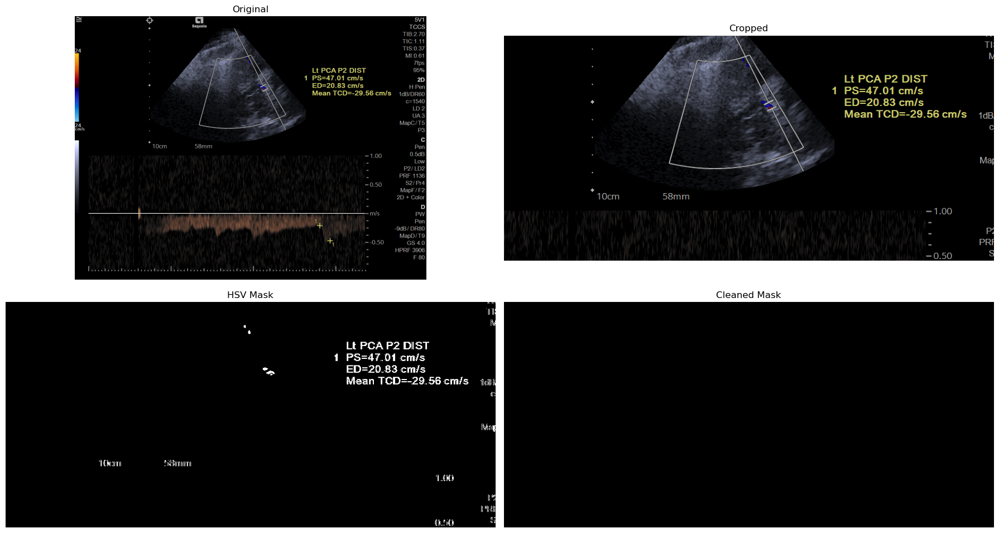

In [17]:
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load skipped images
with open("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/skipped_images.txt", "r") as f:
    skipped = [line.strip() for line in f.readlines()]

print("Total skipped:", len(skipped))

# Random pick
img_path = random.choice(skipped)
print("\nShowing skipped image:\n", img_path)

img = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# --- same crop ---
def auto_crop(im):
    h, w = im.shape[:2]
    return im[int(h*0.10):h-int(h*0.35), int(w*0.05):w-int(w*0.05)]

cropped = auto_crop(img)

# --- HSV masks ---
hsv = cv2.cvtColor(cropped, cv2.COLOR_BGR2HSV)

lower_red1=np.array([0,80,80]); upper_red1=np.array([10,255,255])
lower_red2=np.array([170,80,80]); upper_red2=np.array([180,255,255])
mask_red = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)

lower_oy=np.array([10,120,80]); upper_oy=np.array([35,255,255])
mask_oy = cv2.inRange(hsv, lower_oy, upper_oy)

lower_blue=np.array([85,60,60]); upper_blue=np.array([140,255,255])
mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)

mask = mask_red | mask_oy | mask_blue

kernel = np.ones((7,7), np.uint8)
clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
clean2 = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel)

# --- visualization ---
plt.figure(figsize=(18, 10))

plt.subplot(2,2,1); plt.title("Original"); plt.imshow(img_rgb); plt.axis("off")
plt.subplot(2,2,2); plt.title("Cropped"); plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB)); plt.axis("off")
plt.subplot(2,2,3); plt.title("HSV Mask"); plt.imshow(mask, cmap="gray"); plt.axis("off")
plt.subplot(2,2,4); plt.title("Cleaned Mask"); plt.imshow(clean2, cmap="gray"); plt.axis("off")

plt.tight_layout()
plt.show()


Total skipped: 242

Showing skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/31/DICOM\1.3.12.2.1107.5.5.17.820288.30000024110108424852600000093.png

Showing skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/record6/DICOM\1.3.12.2.1107.5.5.17.820288.30000025073105572134000000055.png

Showing skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/42/DICOM\1.3.12.2.1107.5.5.17.820288.30000024111709451865500000023.png

Showing skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/49/DICOM\1.3.12.2.1107.5.5.17.820288.30000024110809255064500000036.png

Showing skipped: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/50/DICO

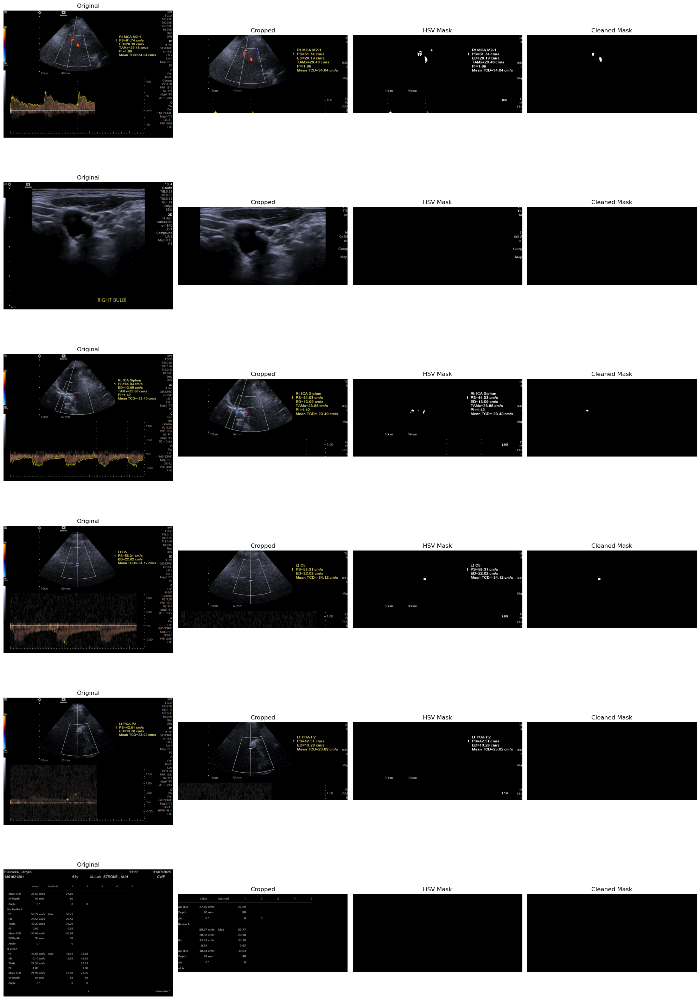

In [18]:
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------------------------------
# Load skipped images
# -----------------------------------------------------------
with open("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/skipped_images.txt", "r") as f:
    skipped = [line.strip() for line in f.readlines()]

print("Total skipped:", len(skipped))

# Pick 6 random skipped images
sample_paths = random.sample(skipped, 6)

# -----------------------------------------------------------
# Cropping function
# -----------------------------------------------------------
def auto_crop(im):
    h, w = im.shape[:2]
    return im[int(h*0.10):h-int(h*0.35), int(w*0.05):w-int(w*0.05)]

# -----------------------------------------------------------
# Start figure layout (6 rows × 4 columns)
# -----------------------------------------------------------
plt.figure(figsize=(20, 30))

plot_index = 1

for img_path in sample_paths:
    print("\nShowing skipped:", img_path)

    img = cv2.imread(img_path)
    if img is None:
        continue
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    cropped = auto_crop(img)

    # HSV masks
    hsv = cv2.cvtColor(cropped, cv2.COLOR_BGR2HSV)

    lower_red1=np.array([0,80,80]); upper_red1=np.array([10,255,255])
    lower_red2=np.array([170,80,80]); upper_red2=np.array([180,255,255])
    mask_red = cv2.inRange(hsv, lower_red1, upper_red1) | cv2.inRange(hsv, lower_red2, upper_red2)

    lower_oy=np.array([10,120,80]); upper_oy=np.array([35,255,255])
    mask_oy = cv2.inRange(hsv, lower_oy, upper_oy)

    lower_blue=np.array([85,60,60]); upper_blue=np.array([140,255,255])
    mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)

    mask = mask_red | mask_oy | mask_blue

    kernel = np.ones((7,7), np.uint8)
    clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    clean2 = cv2.morphologyEx(clean, cv2.MORPH_CLOSE, kernel)

    # ---- Plot each image with 4 steps ----
    plt.subplot(6, 4, plot_index)
    plt.title("Original")
    plt.imshow(img_rgb)
    plt.axis("off")
    plot_index += 1

    plt.subplot(6, 4, plot_index)
    plt.title("Cropped")
    plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plot_index += 1

    plt.subplot(6, 4, plot_index)
    plt.title("HSV Mask")
    plt.imshow(mask, cmap="gray")
    plt.axis("off")
    plot_index += 1

    plt.subplot(6, 4, plot_index)
    plt.title("Cleaned Mask")
    plt.imshow(clean2, cmap="gray")
    plt.axis("off")
    plot_index += 1


plt.tight_layout()
plt.show()


Total ROI images: 1924


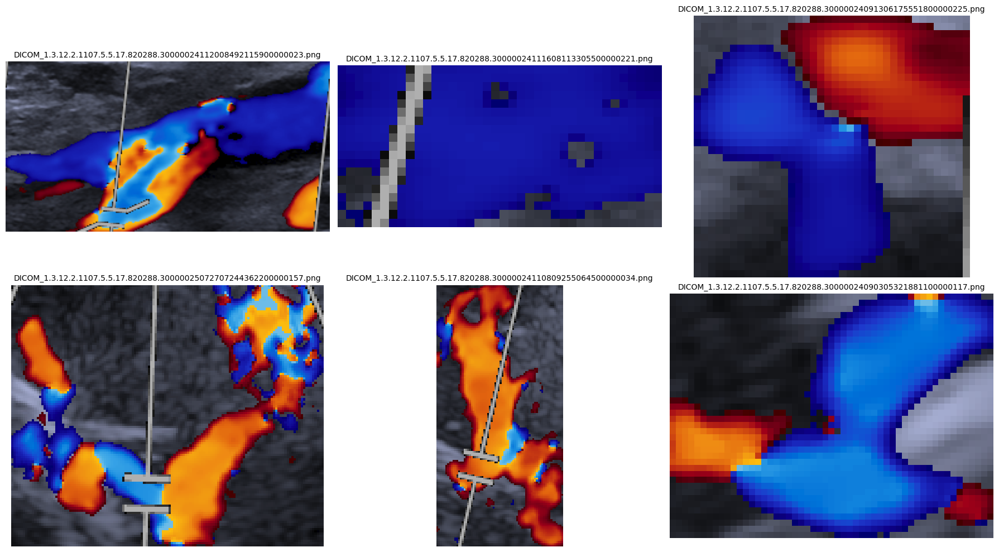

In [19]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# -----------------------------------------------------------
# ROI ROOT DIRECTORY
# -----------------------------------------------------------
roi_root = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Extracted_roi_folder"

# -----------------------------------------------------------
# Collect all ROI image paths recursively
# -----------------------------------------------------------
roi_images = []

for folder in os.listdir(roi_root):
    folder_path = os.path.join(roi_root, folder)

    if not os.path.isdir(folder_path):
        continue

    for f in os.listdir(folder_path):
        if f.lower().endswith(".png"):
            roi_images.append(os.path.join(folder_path, f))

print("Total ROI images:", len(roi_images))

# -----------------------------------------------------------
# Select 6 random ROI images
# -----------------------------------------------------------
sample_paths = random.sample(roi_images, 6)

# -----------------------------------------------------------
# Visualization: 6 ROIs in 2 rows × 3 columns
# -----------------------------------------------------------
plt.figure(figsize=(18, 10))

for i, img_path in enumerate(sample_paths, 1):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i)
    plt.title(os.path.basename(img_path), fontsize=10)
    plt.imshow(img_rgb)
    plt.axis("off")

plt.tight_layout()
plt.show()


In [20]:
import pandas as pd

# Path to your existing CSV
csv_path = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/datamain_doppler_features.csv"

# Load CSV
df = pd.read_csv(csv_path)

# Convert ratio columns → percentage (×100)
ratio_cols = ["red_ratio", "orange_yellow_ratio", "blue_ratio"]

for col in ratio_cols:
    if col in df.columns:
        df[col] = df[col] * 100   # convert to %
        df[col] = df[col].round(2)  # round to 2 decimal places

# Save updated CSV
output_path = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/color_percentage_ratio.csv"
df.to_csv(output_path, index=False)

print("✔ Updated CSV saved as:")
print(output_path)

df.head()


✔ Updated CSV saved as:
/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/color_percentage_ratio.csv


,folder,image,roi_path,jet_area,jet_width,jet_height,jet_length,red_ratio,orange_yellow_ratio,blue_ratio
0,29,DICOM\1.3.12.2.1107.5.5.17.820288.300000240908...,/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/...,218,18,18,25.455844,65.43,0.00,4.94
1,29,DICOM\1.3.12.2.1107.5.5.17.820288.300000240908...,/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/...,5878,82,126,150.332964,25.77,12.96,18.55
2,29,DICOM\1.3.12.2.1107.5.5.17.820288.300000240908...,/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/...,49358,438,173,470.927808,30.81,3.32,30.38
3,29,DICOM\1.3.12.2.1107.5.5.17.820288.300000240908...,/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/...,334,19,21,28.319605,54.64,31.58,4.51
4,29,DICOM\1.3.12.2.1107.5.5.17.820288.300000240908...,/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/...,391,15,35,38.078866,39.05,32.57,5.14


In [22]:
import pandas as pd

# Your two CSV files
df1 = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/color_percentage_ratio.csv")
df2 = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Detected_side_value.csv")

# Clean image column (remove spaces, ensure same datatype)
df1["image"] = df1["image"].astype(str).str.strip()
df2["image"] = df2["image"].astype(str).str.strip()

# Merge only rows where image names match
merged = df1.merge(df2, on="image", how="inner")

# Save result
merged.to_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Final_dataset.csv", index=False)

print("✔ Merge completed!")
print("✔ Saved as merged_dataset.csv")
print("✔ Total matched rows:", len(merged))


✔ Merge completed!
✔ Saved as merged_dataset.csv
✔ Total matched rows: 1924


In [23]:
import pandas as pd

# Load your merged file
df = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Final_dataset.csv")

# Keep only ONE folder column
# Prefer folder_x, but if it's missing values, folder_y will fill them
df["Patient_Number"] = df["folder_x"].fillna(df["folder_y"])

# Drop both old folder columns
df = df.drop(columns=["folder_x", "folder_y"])

# Save cleaned final master dataset
output_path = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/MASTER_DATASET.csv"
df.to_csv(output_path, index=False)

print("✔ MASTER_DATASET created!")
print("✔ Columns now:", list(df.columns))
print("✔ Saved as:", output_path)


✔ MASTER_DATASET created!
✔ Columns now: ['image', 'roi_path', 'jet_area', 'jet_width', 'jet_height', 'jet_length', 'red_ratio', 'orange_yellow_ratio', 'blue_ratio', 'PS', 'ED', 'Side', 'prox_ica_right_stenosis', 'prox_ica_left_stenosis', 'detected_side_value', 'Patient_Number']
✔ Saved as: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/MASTER_DATASET.csv


Loaded rows: 1924
Unique stenosis classes: [ 0.  1.  2. nan]

🔹 Stenosis class distribution:
prox_ica_right_stenosis
0.0    1570
1.0     196
2.0      90
Name: count, dtype: int64

🔹 Mean feature values per stenosis class:
                            jet_area   jet_width  jet_height  jet_length  \
prox_ica_right_stenosis                                                    
0.0                      6343.012102  120.689172   69.980255  143.774691   
1.0                      6546.336735  135.321429   71.005102  156.297514   
2.0                      8153.344444  162.044444   77.077778  184.246108   

                         red_ratio  orange_yellow_ratio  blue_ratio  \
prox_ica_right_stenosis                                               
0.0                      25.797306             9.302369   24.306452   
1.0                      24.337041             9.547143   23.220663   
2.0                      26.880000             5.489667   23.186667   

                                 PS      

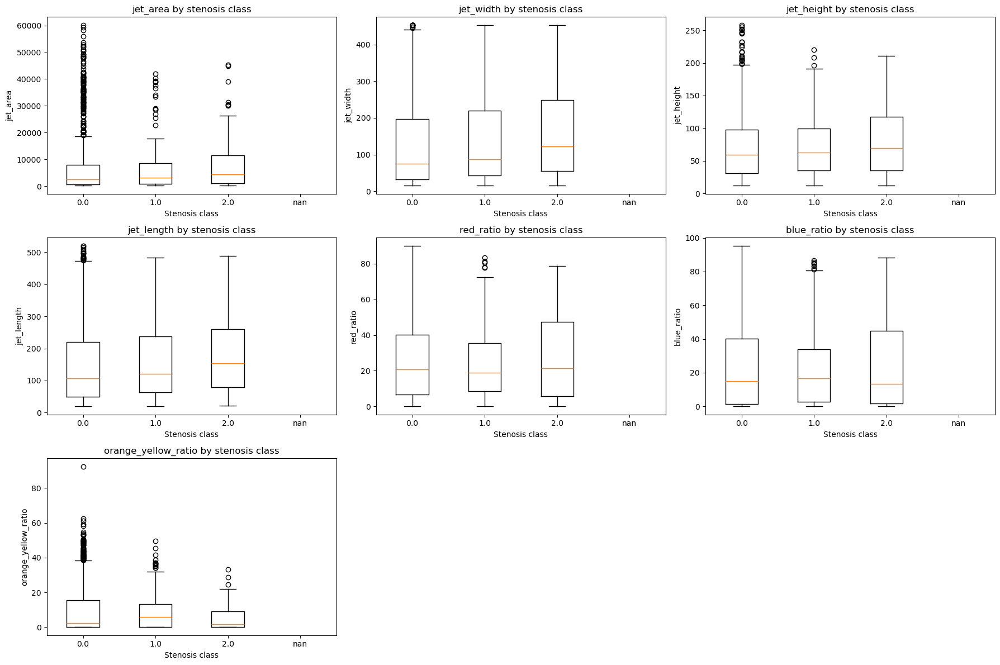

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load your final dataset
df = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/MASTER_DATASET.csv")

stenosis_col = "prox_ica_right_stenosis"

print("Loaded rows:", len(df))
print("Unique stenosis classes:", df[stenosis_col].unique())

# ============================================================
# 1. CLASS DISTRIBUTION
# ============================================================
print("\n🔹 Stenosis class distribution:")
print(df[stenosis_col].value_counts())


# ============================================================
# 2. MEAN FEATURE TRENDS PER STENOSIS CLASS
# ============================================================
mean_table = df.groupby(stenosis_col).mean(numeric_only=True)
print("\n🔹 Mean feature values per stenosis class:")
print(mean_table)


# ============================================================
# 3. CORRELATION OF FEATURES WITH STENOSIS DEGREE
# ============================================================
corr = df.corr(numeric_only=True)[stenosis_col].sort_values(ascending=False)

print("\n🔹 Correlation of each feature with stenosis severity:")
print(corr)


# ============================================================
# 4. PICK FEATURES TO VISUALIZE (INCLUDING RED/BLUE RATIOS)
# ============================================================
# Select the important features:
top_features = [
    "jet_area",
    "jet_width",
    "jet_height",
    "jet_length",
    "red_ratio",
    "blue_ratio",
    # optionally include:
    "orange_yellow_ratio"
]


# ============================================================
# 5. BOXPLOTS FOR VISUAL SEPARATION
# ============================================================
plt.figure(figsize=(18, 12))

classes = sorted(df[stenosis_col].unique())

for i, feature in enumerate(top_features):
    if feature not in df.columns:
        print(f"⚠ Skipping missing feature: {feature}")
        continue

    plt.subplot(3, 3, i+1)

    # Collect feature values for each stenosis class
    data = [df[df[stenosis_col] == c][feature] for c in classes]

    plt.boxplot(data, tick_labels=[str(c) for c in classes])
    plt.title(f"{feature} by stenosis class")
    plt.xlabel("Stenosis class")
    plt.ylabel(feature)

plt.tight_layout()
plt.show()


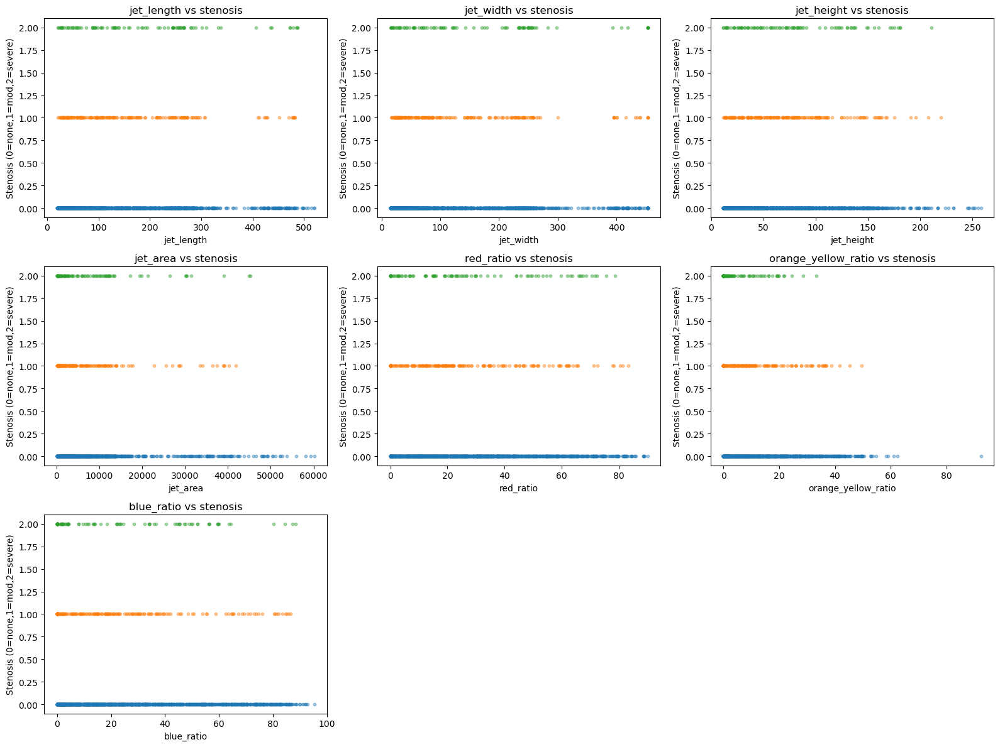

In [25]:
import matplotlib.pyplot as plt

features = [
    "jet_length",
    "jet_width",
    "jet_height",
    "jet_area",
    "red_ratio",
    "orange_yellow_ratio",
    "blue_ratio"
]

plt.figure(figsize=(16, 12))

for i, feature in enumerate(features):
    plt.subplot(3, 3, i+1)
    for cls in [0, 1, 2]:
        subset = df[df["prox_ica_right_stenosis"] == cls]
        plt.scatter(subset[feature], subset["prox_ica_right_stenosis"], s=10, label=f"class {cls}", alpha=0.4)
    
    plt.title(f"{feature} vs stenosis")
    plt.xlabel(feature)
    plt.ylabel("Stenosis (0=none,1=mod,2=severe)")

plt.tight_layout()
plt.show()


In [27]:
import os
import pandas as pd
import cv2
import easyocr
import matplotlib.pyplot as plt

ROOT = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"

df = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/MASTER_DATASET.csv")

reader = easyocr.Reader(['en'])


def find_image_by_suffix(root_folder, short_name):
    """
    Finds the real image whose filename ends with the short clean filename.
    Example:
        short_name = '30000024112008492115900000032.png'
        matches => 'DICOM\\1.3.12.....30000024112008492115900000032.png'
    """
    for r, d, f in os.walk(root_folder):
        for file in f:
            if file.endswith(short_name):
                return os.path.join(r, file)
    return None


# ---- PICK RANDOM ROW ----
row = df.sample(1).iloc[0]
clean_name = str(row["image"]).strip()
side_csv = row["detected_side"]

print("\nCSV clean_file:", clean_name)
print("Detected side from CSV:", side_csv)
print("Searching for a file that ends with:", clean_name)


# ---- SEARCH BY SUFFIX ----
img_path = find_image_by_suffix(ROOT, clean_name)

if img_path is None:
    print("\n❌ Image NOT found in any subfolder:", clean_name)
else:
    print("\n✔ Image FOUND at:", img_path)

    # Load image
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # OCR reading
    ocr_text = reader.readtext(img_path, detail=0)

    # Visualization (LARGE SIZE)
plt.figure(figsize=(50, 50), dpi=150)  # MUCH bigger and sharper display
plt.imshow(img_rgb)
plt.axis("off")
plt.title(f"CSV side: {side_csv}  |  OCR text: {ocr_text}", fontsize=18)
plt.tight_layout()
plt.show()



Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


KeyError: 'detected_side'

In [29]:
import os
import pandas as pd
import cv2
import easyocr
import matplotlib.pyplot as plt

ROOT = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"

df = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/MASTER_DATASET.csv")

reader = easyocr.Reader(['en'])


def find_image_by_suffix(root_folder, short_name):
    """Return full path of the file whose name ends with short_name."""
    for r, d, f in os.walk(root_folder):
        for file in f:
            if file.endswith(short_name):
                return os.path.join(r, file)
    return None


# ---- PICK RANDOM ROW ----
row = df.sample(1).iloc[0]
clean_name = str(row["image"]).strip()

# Always use SIDE column ONLY
side_csv = row["Side"]      # <-- LEFT / RIGHT


print("\nCSV image:", clean_name)
print("Side (LEFT/RIGHT):", side_csv)
print("Searching for file ending with:", clean_name)


# ---- SEARCH ----
img_path = find_image_by_suffix(ROOT, clean_name)

if img_path is None:
    print("\n❌ Image NOT found:", clean_name)
else:
    print("\n✔ FOUND:", img_path)

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    ocr_text = reader.readtext(img_path, detail=0)

    # ---- VISUALIZATION ----
    plt.figure(figsize=(50, 50), dpi=150)
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(
        f"Side from CSV: {side_csv}   |   OCR text: {ocr_text}",
        fontsize=20
    )
    plt.tight_layout()
    plt.show()


Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.



CSV image: DICOM\1.3.12.2.1107.5.5.17.820288.30000024092907011561000000027.png
Side (LEFT/RIGHT): Left
Searching for file ending with: DICOM\1.3.12.2.1107.5.5.17.820288.30000024092907011561000000027.png

✔ FOUND: /work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon/20/DICOM\1.3.12.2.1107.5.5.17.820288.30000024092907011561000000027.png


/opt/conda/lib/python3.12/site-packages/torch/utils/data/dataloader.py:668: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Using CPU. Note: This module is much faster with a GPU.


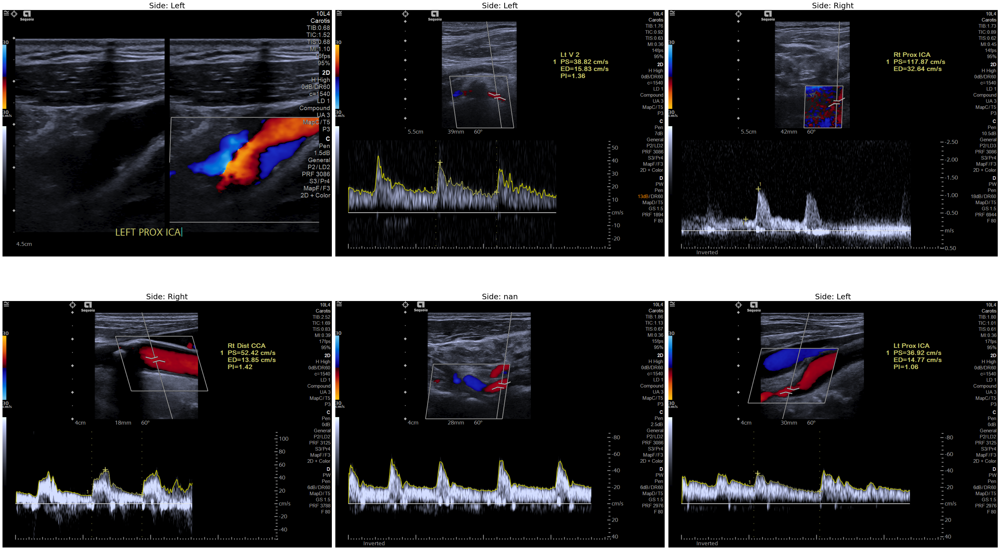

In [31]:
import os
import pandas as pd
import cv2
import easyocr
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")  # REMOVE ALL WARNINGS

ROOT = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"
df = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/MASTER_DATASET.csv")

reader = easyocr.Reader(['en'], gpu=False)  # OCR still works but output hidden


def find_image_by_suffix(root_folder, short_name):
    for r, d, f in os.walk(root_folder):
        for file in f:
            if file.endswith(short_name):
                return os.path.join(r, file)
    return None


# Pick 6 random images
rows = df.sample(6)

plt.figure(figsize=(40, 25))

for idx, (_, row) in enumerate(rows.iterrows(), start=1):

    clean_name = str(row["image"]).strip()
    side = row["Side"]  # only side shown (Left/Right)

    img_path = find_image_by_suffix(ROOT, clean_name)
    if img_path is None:
        continue

    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # --------- PLOT ONLY IMAGE + SIDE ---------
    plt.subplot(2, 3, idx)
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(f"Side: {side}", fontsize=22)

plt.tight_layout()
plt.show()


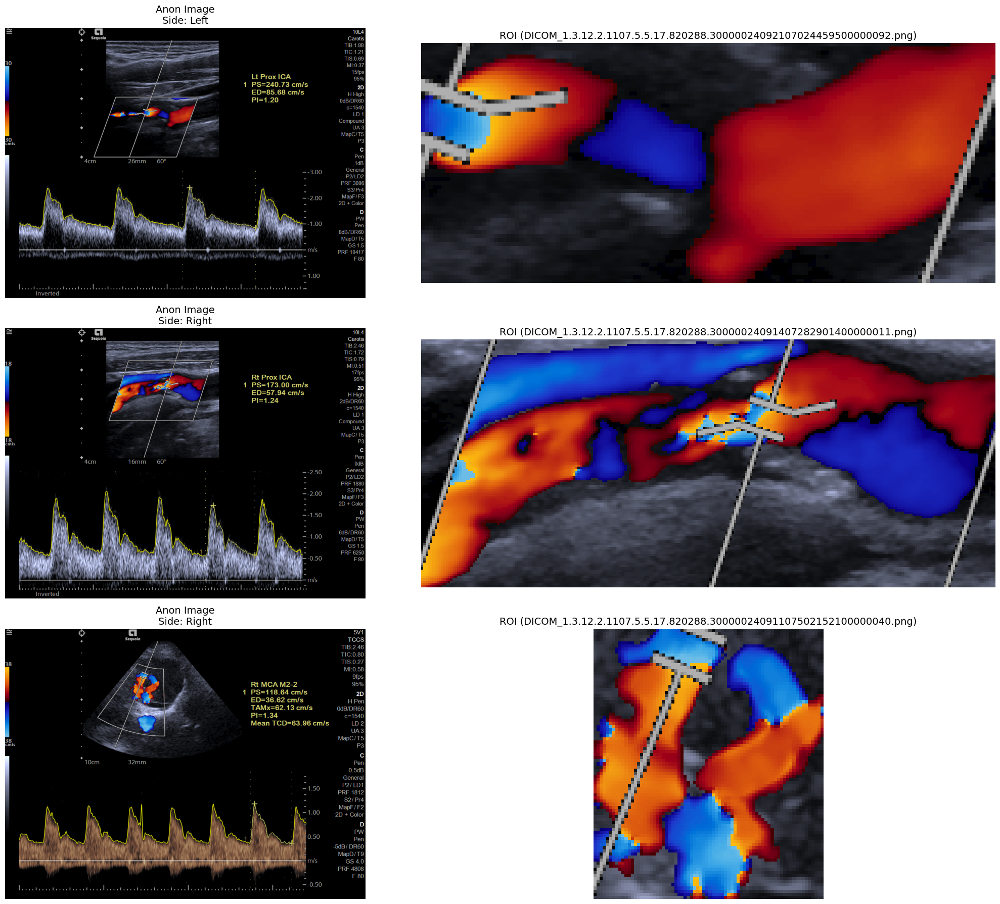

In [33]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

# ---------------------------------------------------------------
# PATHS
# ---------------------------------------------------------------

ROOT_ANON = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/png_ultrasound_anon"
ROI_ROOT  = "/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/Extracted_roi_folder"

df = pd.read_csv("/work/SanzidaAkterChadne#0992/Jobs/JupyterLab/5486489/main/Raw_data_stenosis/stenosis_project/data/MASTER_DATASET.csv")

# ---------------------------------------------------------------
# Utility: find a file anywhere under a folder by filename match
# ---------------------------------------------------------------
def find_file_by_name(root, target_name):
    """
    Searches recursively inside 'root' for any file whose name equals 'target_name'.
    Example: find_file_by_name(ROI_ROOT, '299200000034.png')
    """
    for r, d, f in os.walk(root):
        for file in f:
            if file == target_name:    # exact filename match
                return os.path.join(r, file)
    return None


# ---------------------------------------------------------------
# Utility: find anonymized image by suffix
# ---------------------------------------------------------------
def find_anon_image(root, image_name):
    for r, d, f in os.walk(root):
        for file in f:
            if file.endswith(image_name):
                return os.path.join(r, file)
    return None


# ---------------------------------------------------------------
# Select 3 random rows with roi_path available
# ---------------------------------------------------------------
samples = df.dropna(subset=["roi_path"]).sample(3)

plt.figure(figsize=(22, 18))
row_idx = 1

for idx, row in samples.iterrows():

    image_name = row["image"]          # anonymized filename
    roi_filename = os.path.basename(str(row["roi_path"]).strip())  # last part
    side_val = row["Side"]

    # ---- find anonymized image ----
    anon_path = find_anon_image(ROOT_ANON, image_name)
    if anon_path is None:
        print("❌ Missing ANON:", image_name)
        continue

    anon_rgb = cv2.cvtColor(cv2.imread(anon_path), cv2.COLOR_BGR2RGB)

    # ---- find ROI using roi_path column ----
    roi_path = find_file_by_name(ROI_ROOT, roi_filename)
    if roi_path is None:
        print("❌ Missing ROI:", roi_filename)
        continue

    roi_rgb = cv2.cvtColor(cv2.imread(roi_path), cv2.COLOR_BGR2RGB)

    # -----------------------------------------------------------
    # VISUALIZATION
    # -----------------------------------------------------------
    plt.subplot(3, 2, row_idx)
    plt.imshow(anon_rgb)
    plt.axis("off")
    plt.title(f"Anon Image\nSide: {side_val}", fontsize=14)

    plt.subplot(3, 2, row_idx + 1)
    plt.imshow(roi_rgb)
    plt.axis("off")
    plt.title(f"ROI ({roi_filename})", fontsize=14)

    row_idx += 2

plt.tight_layout()
plt.show()
